# A data workflow example using Python

## Introduction

**This demo simply aims to illustrate several Python powers**

<hr />

<div>
<img src="../../data/whoami.png" alt="wordcloud">
<div/>


<hr />

## Demo format

- do interrupt
- do ask questions
- you are totally free to suggest different coding avenues
- and if you like, lets make this work, then break it, then fix it

<hr/>

### Now go to `*.xlsx` and `Read_NPD_CSV_digidemo` before coming back here.

In [1]:
# imports
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import plotly_express as px
from ipywidgets import interact

### Load a single spreadsheet

I have downloaded a \*.csv file containing "Total Saleable Production" as an example from the [Diskos DataBrowser](https://portal.diskos.cgg.com/whereoil-data/) supplied by the [Norwegian Petroleum Directorate](https://www.npd.no/).

We can get the data directly from the NPD website by visiting [this link](http://factpages.npd.no/factpages/Default.aspx?culture=nb-no&nav1=field&nav2=TableView|Production|Saleable|Monthly).

In [2]:
df_tot = pd.read_csv('../../data/Total_Saleable_prod.csv', sep='|')
df_tot.head()

,Name,Month,Product,Volume,Volume Uom,Mass,Mass Uom,Density,Density Uom,Energy,Energy Uom,Gross Calorific Value,Gross Calorific Value Uom,Share Country
0,GINA KROG,2019-01-01T00:00:00,gas - dry,2293436.0,Sm3,3354775.0,kg,1.463,kg/Sm3,172090830.0,MJ,NaN,NaN,NORWAY
1,VISUND SØR,2019-01-01T00:00:00,isobutane,1451.0,Sm3,816827.0,kg,562.876,kg/Sm3,40313033.0,MJ,NaN,NaN,NORWAY
2,BALDER,2019-01-01T00:00:00,oil - net,141419.0,Sm3,125434334.0,kg,886.960,kg/Sm3,NaN,NaN,NaN,NaN,NORWAY
3,TUNE,2019-01-01T00:00:00,naphta,7.0,Sm3,5000.0,kg,690.800,kg/Sm3,NaN,NaN,NaN,NaN,NORWAY
4,SKARV,2019-01-01T00:00:00,normal butane,10718.0,Sm3,6264365.0,kg,584.491,kg/Sm3,310084639.0,MJ,NaN,NaN,NORWAY


In [3]:
df_tot.shape, df_tot.size

((97253, 14), 1361542)

In [4]:
df_tot = df_tot.drop(columns=['Gross Calorific Value', 'Gross Calorific Value Uom'])
df_tot['Month'] = pd.to_datetime(df_tot['Month'])
df_tot = df_tot.set_index('Month')
df_tot['Month'] = df_tot.index
df_tot.sort_index(inplace=True)

In [5]:
df_tot.head()

,Name,Product,Volume,Volume Uom,Mass,Mass Uom,Density,Density Uom,Energy,Energy Uom,Share Country,Month
Month,,,,,,,,,,,,
1971-06-01,EKOFISK,oil - net,192.0,Sm3,152000.0,kg,791.1999,kg/Sm3,NaN,NaN,NORWAY,1971-06-01
1971-07-01,EKOFISK,oil - net,33772.0,Sm3,26720000.0,kg,791.1999,kg/Sm3,NaN,NaN,NORWAY,1971-07-01
1971-08-01,EKOFISK,oil - net,51387.0,Sm3,40657000.0,kg,791.1999,kg/Sm3,NaN,NaN,NORWAY,1971-08-01
1971-09-01,EKOFISK,oil - net,64295.0,Sm3,50870000.0,kg,791.1999,kg/Sm3,NaN,NaN,NORWAY,1971-09-01
1971-10-01,EKOFISK,oil - net,86403.0,Sm3,68362000.0,kg,791.1999,kg/Sm3,NaN,NaN,NORWAY,1971-10-01


In [6]:
px.scatter(df_tot, x='Month', y='Mass', color='Product', title='All Fields - Saleable Production')

In [7]:
df_tot.Product.unique()

array(['oil - net', 'gas - dry', 'condensate - net', 'isobutane',
       'propane', 'ethane', 'normal butane', 'naphta',
       'liquified petroleum gas', 'natural gas liquid',
       'liquified natural gas', 'gas - wet', 'gas'], dtype=object)

In [8]:
@interact(fieldname=sorted(df_tot.Name.unique()))
def plot_field(fieldname):
    fig, axs = plt.subplots(figsize=(18, 8), nrows=2, ncols=2, sharex=True)
    axs = axs.flatten()
    products = ['oil - net', 'gas - dry', 'condensate - net', 'gas - wet']
    
    for ax, product in zip(axs, products):
        ax.set_title(f'{fieldname}: {product}')
        ax.plot(df_tot.index[(df_tot['Name'] == fieldname) & (df_tot['Product'] == product)],
                df_tot.Mass[(df_tot['Name'] == fieldname) & (df_tot['Product'] == product)])
        ax.grid()
        ax.set_ylim(bottom=0)

    return None

interactive(children=(Dropdown(description='fieldname', options=('33/9-6 DELTA', '7220/11-1 (Alta)', 'AASTA HA…

In [9]:
@interact(fields=sorted(df_tot.Name.unique()))
def xpress_plot(fields):
    plot = px.line(df_tot[df_tot.Name == fields],
                   x='Month',
                   y='Mass',
                   color='Product',
                   title=f'{fields} Saleable production', )
    return plot

interactive(children=(Dropdown(description='fields', options=('33/9-6 DELTA', '7220/11-1 (Alta)', 'AASTA HANST…

## Time Series Forecasting using `fbprophet`

First, what is [`fbprophet`](https://facebook.github.io/prophet/) ?

Now let's got to this [colab notebook](https://ageo.co/dezjgv) and use Facebook's open-source [fbprophet library](https://facebook.github.io/prophet/) to query our data.

### Link to Colab: **https://ageo.co/dezjgv**

## A sneak peak at Numpy

In [10]:
ls -l ../../data/ | grep -i "penobscot*"

-rw-r--r-- 1 geodev geodev 72559459 Dec 18  2018 Penobscot_0-1000ms.npy
-rw-r--r-- 1 geodev geodev 27727545 Feb 17 15:03 penobscot_scroller.gif
-rw-r--r-- 1 geodev geodev  2654676 Feb 17 15:03 penobscot_scroller.mp4


In [11]:
vol = np.load('../../data/Penobscot_0-1000ms.npy')

In [12]:
type(vol)

numpy.ndarray

In [13]:
vol.shape

(601, 481, 251)

In [14]:
arr = np.random.randint(0, 100, size=(4,3,2))
print(arr.shape)
arr

(4, 3, 2)


array([[[56, 63],
        [37,  3],
        [33, 68]],

       [[39, 53],
        [55, 10],
        [42, 65]],

       [[81, 57],
        [91, 29],
        [ 7, 18]],

       [[48, 27],
        [67, 40],
        [73, 30]]])

In [15]:
arr[:,:,1] # a timeslice

array([[63,  3, 68],
       [53, 10, 65],
       [57, 29, 18],
       [27, 40, 30]])

In [16]:
arr[1,:,:] # an inline

array([[39, 53],
       [55, 10],
       [42, 65]])

In [17]:
arr[2,1,:] # a trace

array([91, 29])

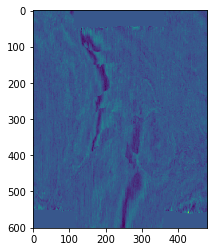

In [18]:
amp = vol[:, :, 200] # timeslice 200
plt.imshow(amp)

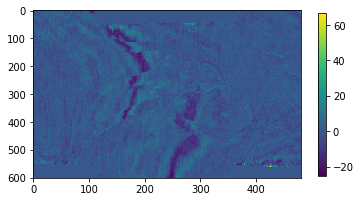

In [19]:
# Change the aspect ratio
plt.imshow(amp, aspect=0.5)
plt.colorbar(shrink=0.75)

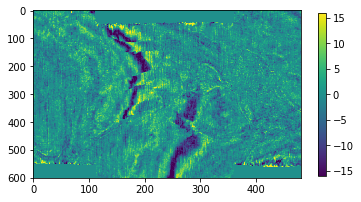

In [20]:
# Fix the the colobar
ma = np.percentile(vol, 98)
plt.imshow(amp, aspect=0.5, vmin=-ma, vmax=ma)
plt.colorbar(shrink=0.75)

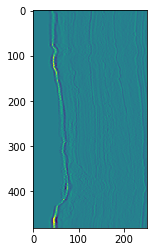

In [21]:
# plot an inline or crossline
plt.imshow(vol[200, :, :]) #inline 200

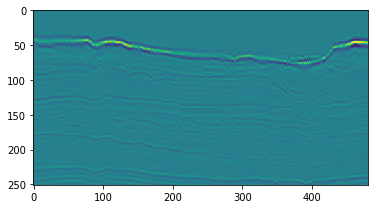

In [22]:
# Transpose the matrix
plt.imshow(vol[200, :, :].T)

In [23]:
arr.flatten()

array([56, 63, 37,  3, 33, 68, 39, 53, 55, 10, 42, 65, 81, 57, 91, 29,  7,
       18, 48, 27, 67, 40, 73, 30])

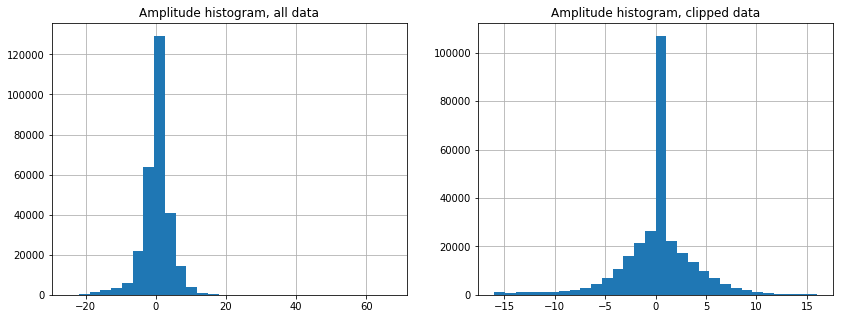

In [24]:
# histogram of amplitudes
fig, axs = plt.subplots(figsize=(14,5), nrows=1, ncols=2)

ax = axs[0]
ax.hist(amp.flatten(), bins=30, zorder=2)
ax.set_title('Amplitude histogram, all data')
ax.grid()

ax = axs[1]
ax.hist(amp.flatten(), bins=30, zorder=2, range=(-ma, ma))
ax.set_title('Amplitude histogram, clipped data')
ax.grid()

plt.show()

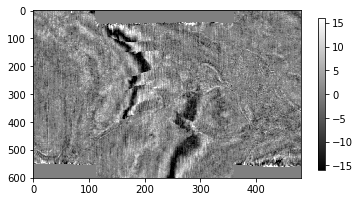

In [25]:
plt.imshow(amp, aspect=0.5, cmap='gray', vmin=-ma, vmax=ma)
plt.colorbar(shrink=0.7)

In [26]:
import plotter # see plotter.py for code

interactive(children=(Dropdown(description='colormap', options=('viridis', 'plasma', 'inferno', 'magma', 'Grey…

We can make an animation of this too with only [a few lines of code](Animation_demo_v2.ipynb).

<div>
<img src="../../data/penobscot_scroller.gif" alt="scroller">
<div/>

## Looking at reserves

In [27]:
df_res = pd.read_csv('../../data/npd_FieldReserves.csv', sep='|')
df_res.head()

,Fld Name,Fld Recoverable Oil,Fld Remaining Oil,Fld Recoverable Gas,Fld Remaining Gas,Fld Recoverable NGL,Fld Remaining NGL,Fld Recoverable Condensate,Fld Remaining Condensate,Fld Date Off Res Est Display,Datesync NPD
0,EMBLA,12.41,0.73,5.53,0.72,0.65,0.09,0.00,0.00,2018-12-31T00:00:00,2019-06-02T00:00:00
1,JOTUN,23.14,0.00,0.88,0.00,0.00,0.00,0.00,0.00,2018-12-31T00:00:00,2019-06-02T00:00:00
2,AASTA HANSTEEN,0.00,0.00,54.40,54.36,0.00,0.00,0.64,0.61,2018-12-31T00:00:00,2019-06-02T00:00:00
3,FLYNDRE,0.08,0.04,0.00,0.00,0.00,0.00,0.00,0.00,2018-12-31T00:00:00,2019-06-02T00:00:00
4,ÆRFUGL,6.77,5.75,34.53,30.10,3.86,3.36,0.00,0.00,2018-12-31T00:00:00,2019-06-02T00:00:00


In [28]:
px.scatter(df_res, x='Fld Remaining Oil', y='Fld Recoverable Oil', color='Fld Name', size='Fld Recoverable Oil', title='Recoverable vs Remaining OIL')

**Add Field recoverable oil to the production DataFrame**

In [ ]:
df_tot['Fld_Recoverable_Oil'] = np.nan
for field in df_res['Fld Name'].unique():
    field_reserve = df_res.loc[df_res['Fld Name'] == field, 'Fld Recoverable Oil'].values
    df_tot.loc[df_tot['Name'] == field, 'Fld_Recoverable_Oil'] = field_reserve
df_tot.head()

In [ ]:
df_tot.loc[df_tot['Name'] == 'EKOFISK', 'Volume'].sum()

In [ ]:
px.scatter(df_tot, x='Month', y='Mass', color='Name')

In [ ]:
df_tot.head()

In [ ]:
df_tot['Volume_max'] = np.nan
for field in df_tot.Name.unique():
    max_vol = df_tot.loc[df_tot['Name'] == field, 'Volume'].max()
    df_tot.loc[df_tot['Name'] == field, 'Volume_max'] = max_vol
df_tot.head()

In [ ]:
df_tot['Mass_max'] = np.nan
for field in df_tot.Name.unique():
    max_mass = df_tot.loc[df_tot['Name'] == field, 'Mass'].max()
    df_tot.loc[df_tot['Name'] == field, 'Mass_max'] = max_mass
df_tot.head()

In [ ]:
df_tot.loc[df_tot['Product'] == 'oil - net'].shape, df_tot.shape

In [ ]:
px.scatter(df_tot.loc[df_tot['Product'] == 'oil - net'],
           x='Mass_max',
           y='Fld_Recoverable_Oil',
           color='Name',
           title='Field Recoverable Oil vs Max mass produced',
          )

<hr/>

<div>
<img src="https://avatars1.githubusercontent.com/u/1692321?s=50">
<a rel="license" href="http://creativecommons.org/licenses/by/4.0/">
    <img alt="Creative Commons License" style="border-width:0" src="https://i.creativecommons.org/l/by/4.0/88x31.png"/>
</div>
    
<br />This work is licensed under a <a rel="license" href="http://creativecommons.org/licenses/by/4.0/">Creative Commons Attribution 4.0 International License
</a>.